In [5]:
# general
import os
BASE_DIR = os.path.dirname(os.path.realpath('__file__'))

from pathlib import Path

# computation
import pandas as pd
import geoglows

# plotting
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [6]:
stations = ['Neak_Luong', 'Stung_Treng', 'Chaktomuk', 'Kompong_Kdei', 'Prek_Kdam', 'Kg._Thmar',
            'Koh_Khel', 'Lumphat', 'Kompong_Cham', 'Phnom_Penh_Port', 'Voeun_Sai', 'Kratie', 
            'Kompong_Chen', 'Kompong_Cham', 'Sisophon'
           ]
# 'Kompong_Thom', 'Battambang', 'Siempang'

In [11]:
Path(f'{BASE_DIR}/spt_vs_mrc/').mkdir(parents=True, exist_ok=True)

dfs_obs = []
dfs_pred = []
dfs = []

for station in stations:
    obs = pd.read_csv(f'{BASE_DIR}/mrc_observations/{station}.csv')
    obs['datetime'] = pd.to_datetime(obs['datetime'])
    obs = obs.set_index('datetime')
#     dfs_obs.append({'station': station, 'df': obs})

    pred = pd.read_csv(f'{BASE_DIR}/spt_predictions/{station}.csv')
    pred['datetime'] = pd.to_datetime(pred['datetime'])
    pred = pred.set_index('datetime')
#     dfs_pred.append({'station': station, 'df': pred})

    obs = obs.rename(columns={'discharge': 'observation'})
    pred = pred.rename(columns={'discharge': 'prediction'})
    df = pd.merge(obs, pred, how='inner', on='datetime')
#     df.sort_values(by=['datetime'], ascending=True, inplace=True)
    dfs.append({'station': station, 'df_obs': obs, 'df_pred': pred})
    

/Users/biplovbhandari/miniconda3/envs/bias/lib/python3.7/site-packages/geoglows/bias.py:132: UserWarning:

The observational data has the same max and min value. You may get unanticipated results.

/Users/biplovbhandari/miniconda3/envs/bias/lib/python3.7/site-packages/geoglows/bias.py:132: UserWarning:

The observational data has the same max and min value. You may get unanticipated results.

/Users/biplovbhandari/miniconda3/envs/bias/lib/python3.7/site-packages/geoglows/bias.py:132: UserWarning:

The observational data has the same max and min value. You may get unanticipated results.



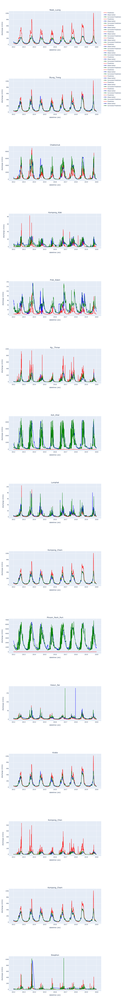

In [23]:
fig = make_subplots(rows=len(dfs), cols=1, start_cell='top-left', subplot_titles = [station['station'] for station in dfs])

for idx, station in enumerate(dfs):
    name = station['station']
    
    df_pred = station['df_pred']
    df_obs = station['df_obs']
    bias_corrected = geoglows.bias.correct_historical(df_pred, df_obs)

    # webgl for fast render
    fig.add_trace(go.Scattergl(x=df_pred.index,
                               y=df_pred.prediction,
#                                name=f'{name} observed',
                               name=f'Prediction',
                               mode='lines',
                               line=dict(color='red'),
#                                showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)

    fig.add_trace(go.Scattergl(x=df_obs.index,
                               y=df_obs.observation,
                               mode='lines+text',
#                                name = f'{dfs_pred[idx]["station"]} predicted',
                               name = f'Observation',
                               line=dict(color='blue'),
#                                showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)
    
    fig.add_trace(go.Scattergl(x=bias_corrected.index,
                               y=bias_corrected['Corrected Simulated Streamflow'],
                               mode='lines+text',
#                                name = f'{dfs_pred[idx]["station"]} predicted',
                               name = f'Corrected Prediction',
                               line=dict(color='green'),
#                                showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)

    fig.update_xaxes(title_text='datetime (utc)', row=idx+1, col=1)
    fig.update_yaxes(title_text='discharge (m3/s)', row=idx+1, col=1)

fig.update_layout(height=len(dfs)*600, width=1000)
fig.show()